In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import torch
import numpy as np
from torch import cuda
from torchvision import datasets, transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import IterableDataset
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML
import os
from torch import nn, optim
import torch.nn.functional as F
from PIL import Image as im
# from torchgan.layers import VirtualBatchNorm

torch.manual_seed(42)

In [2]:
%cd /home/root2

/home/root2


# Inception Score + TARR

In [3]:
# val_noise = torch.normal(0, 1, size=(1000, 1, 100), generator = torch.Generator().manual_seed(999)).cuda()
val_label = torch.tensor([[i]*1000 for i in range(10)]).flatten().cuda()
shuffle_idx = torch.randperm(10000).cuda()

In [4]:
# load classifier
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 6, (5,5)),
            nn.BatchNorm2d(6),
            nn.ReLU(),
            nn.MaxPool2d(2,2)
        )
        
        self.conv2 = nn.Sequential(
            nn.Conv2d(6, 16, (5,5)),
            nn.BatchNorm2d(16),
            nn.ReLU(), 
            nn.MaxPool2d(2,2)
        )
        self.fc1   = nn.Linear(400, 120)
        self.fc2   = nn.Linear(120, 84)
        self.fc3   = nn.Linear(84, 10)
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = x.flatten(start_dim=1)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x
    
    def num_flat_features(self, x):
        size = x.size()[1:]
        num_features = 1
        for s in size:
            num_features *= s
        return num_features 

net = LeNet().cuda()
checkpoint = torch.load('./save/kiet_mnist_classifier.pt')
net.load_state_dict(checkpoint['lenet'])

<All keys matched successfully>

In [5]:
# calculate the inception score for p(y|x)
def calculate_inception_score(p_yx, eps=1e-16):
    # calculate p(y)
    p_y = p_yx.mean(axis=0, keepdims=True)
    # kl divergence for each image
    kl_d = p_yx * (np.log(p_yx + eps) - np.log(p_y + eps))
    # sum over classes
    sum_kl_d = kl_d.sum(axis=1)
    # average over images
    avg_kl_d = np.mean(sum_kl_d)
    # undo the logs
    is_score = np.exp(avg_kl_d)
    return is_score
        
def evaluate(generator):
    total_correct = 0
    class_correct = np.array([0]*10, dtype=float)
    predictions = []
    py_x = []
    softmax = nn.Softmax(dim=1)
    
    net.eval()
    with torch.no_grad():
        for i in range(100): # 10000/100 = 100
            labels = val_label[shuffle_idx[i*100:(i+1)*100]]
            val_noise = torch.normal(0, 1, size=(100, 1, 100)).cuda()
            
            fake_imgs = generator(val_noise, labels)
            logit = net(fake_imgs)
            
            # TARR
            pred = logit.max(1)[1]
            total_correct += pred.eq(labels.view_as(pred)).sum()
            predictions.append(pred)
            
            # Count the number of correct preds for each digit class
            for j in range(10):
                class_idx = labels == j
                class_pred = pred[class_idx]
                class_correct[j] += class_pred.eq(labels[class_idx]).sum()
                
            # Save py_x to calculate Inception Score
            py_x += softmax(logit).cpu().tolist() # += of list is append to the end
            
                
    IS = calculate_inception_score(np.array(py_x))
    TARR = float(total_correct) / 10000
    class_acc = class_correct/1000
    return IS, TARR, class_acc

In [6]:
# IS, TARR, class_acc = TARR_evaluate(generator)
# print(IS, TARR)
# print(class_acc)

# CGAN

In [7]:
transform=transforms.Compose([
        # Pad images with 0s
        transforms.Pad((0,4,4,0), fill=0, padding_mode='constant'),
        transforms.ToTensor(), # Make all pixel value between [0, 1]
        transforms.Normalize((0.5), (0.5)),
        ])

# Download or load train data
dataset_full = datasets.MNIST('./data', train=True, download=True, transform=transform)

# Split train and val data
valid_size = 5000
train_size = len(dataset_full) - 5000
dataset_train, dataset_valid = torch.utils.data.random_split(dataset_full, [train_size, valid_size])

# Download or load test data
dataset_test = datasets.MNIST('./data', train=False,
                   transform=transform)

# Create dataloader
train_kwargs = {'batch_size': 128, 'shuffle': True}
valid_kwargs = {'batch_size': 128, 'shuffle': False}
test_kwargs = {'batch_size': 128, 'shuffle': False}

train_loader = DataLoader(dataset_train, **train_kwargs)
valid_loader = DataLoader(dataset_valid, **valid_kwargs)
test_loader = DataLoader(dataset_test, **test_kwargs)

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm2d') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
    elif classname.find('VirtualBatchNorm') != -1:
        nn.init.normal_(m.gamma.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [9]:
class VirtualBatchNorm(nn.Module):
    def __init__(self, in_features, eps=1e-5):
        super(VirtualBatchNorm, self).__init__()
        self.in_features = in_features
        shape = (1, in_features, 1, 1)
        self.gamma = nn.Parameter(torch.ones(shape))
        self.bias = nn.Parameter(torch.zeros(shape))
        self.ref_mean = None
        self.ref_mean_sq = None
        self.ref_n = None
        self.eps = eps

    def _batch_stats(self, x):
        mean = x.mean(dim=(0, 2, 3), keepdim=True) 
        mean_sq = (x ** 2).mean(dim=(0, 2, 3), keepdim=True)
        
        return mean, mean_sq

    def _normalize(self, x, mean, mean_sq):
        var = (mean_sq - mean**2)
        x = (x - mean) / torch.sqrt(var + self.eps)
        return x * self.gamma + self.bias

    def forward(self, x):
        assert x.size(1) == self.in_features
        if self.ref_mean is None or self.ref_mean_sq is None or self.ref_n is None:
            ref_mean, ref_mean_sq = self._batch_stats(x)
            self.ref_mean = ref_mean.clone().detach() # (1,C,1,1)
            self.ref_mean_sq = ref_mean_sq.clone().detach() # (1,C,1,1)
            self.ref_n = float(x.shape[0]) # int
            out = self._normalize(x, self.ref_mean, self.ref_mean_sq)
        else:
            new_coeff = 1. / (self.ref_n + 1.)
            old_coeff = 1. - new_coeff
            mean = new_coeff * x + old_coeff * self.ref_mean
            mean_sq = new_coeff * (x**2) + old_coeff * self.ref_mean_sq
            out = self._normalize(x, mean, mean_sq)
        return out


In [10]:
class UpSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UpSample, self).__init__()
        self.up_sample = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.up_sample(x)

class DownSample(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DownSample, self).__init__()
        self.down_sample = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, x):
        return self.down_sample(x)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.project_noise = nn.Linear(100, 4*4*256, bias=False)
        self.project_label = nn.Linear(10, 4*4*256, bias=False)
        self.norm_noise = nn.BatchNorm2d(256)
        self.norm_label = nn.BatchNorm2d(256)
        self.conv_block = nn.Sequential(
            UpSample(512, 256),
            UpSample(256, 128),
        )
        self.last_conv = nn.ConvTranspose2d(128, 1, kernel_size=4, stride=2, padding=1, bias=False)

    def forward(self, noise, label):
        noise = self.project_noise(noise).view(noise.shape[0], 256, 4, 4)
        label = self.project_label(F.one_hot(label, num_classes=10).float()).view(label.shape[0], 256, 4, 4)
        noise = self.norm_noise(noise)
        label = self.norm_label(label)
        out = torch.cat((label, noise), dim=1)
        
        out = self.conv_block(out)
        out = torch.tanh(self.last_conv(out))
        return out

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.g_conv = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        self.project_label = nn.Sequential(
            nn.Linear(10, 16*16*64, bias=False),
            nn.LeakyReLU(0.2, inplace=True)
        )
        
        
        self.conv_block = nn.Sequential(
            DownSample(128, 256),
            DownSample(256, 512),
            DownSample(512, 1024), # Remove
            nn.Flatten(start_dim=1),
#             nn.Linear(4*4*512, 1, bias=False),
            nn.Linear(2*2*1024, 1, bias=False), # Remove
            nn.Sigmoid()
        )

    def forward(self, g_out, label):
        out = torch.cat((self.g_conv(g_out),
                         self.project_label(F.one_hot(label, num_classes=10).float()).view(label.shape[0], 64, 16, 16)),
                               dim=1)
        
        return self.conv_block(out)

In [11]:
criterion = nn.BCELoss()

In [12]:
generator = Generator().cuda()
generator.apply(weights_init)
discriminator = Discriminator().cuda()
discriminator.apply(weights_init)

lr=2e-4
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

num_epochs = 10
# print(generator)
# print()
# print(discriminator)


In [13]:
PATH = './save/CGAN.pt'
best_TARR = 0
best_IS = 0

In [14]:
g_losses = []
d_losses = []
iters = 0
img_list = []
img_list_raw = []
fixed_noise = torch.normal(0, 1, size=(10*8, 1, 100)).cuda()
fixed_label = torch.tensor([[i]*8 for i in range(10)]).flatten().cuda()
alpha = 0.7
D_x_hist = []
D_Gz_hist = []

for epoch in range(num_epochs):
    for i, (imgs, labels) in enumerate(train_loader):
        g_loss_epoch, d_loss_epoch = [], []
        D_x_epoch, D_Gz_epoch = [], []  
        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        
        discriminator.zero_grad()
        real_out = discriminator(imgs.cuda(), labels.cuda())
        CE_labels = torch.full(real_out.shape, alpha, dtype=torch.float).cuda()
        d_loss_real = criterion(real_out, CE_labels.cuda()) # One-sided label smoothing
        d_loss_real.backward()
        D_x = real_out.mean().item()
        
        ## Train with all-fake batch
        # Sample noise and labels as generator input
        z = torch.normal(0, 1, size=(imgs.shape[0], 1, 100)).cuda()
        gen_labels = torch.tensor(np.random.randint(0, 10, imgs.shape[0])).cuda()
        fake_imgs = generator(z, gen_labels)
        fake_out = discriminator(fake_imgs.detach(), gen_labels)
        d_loss_fake = criterion(fake_out, torch.full(fake_out.shape, 0, dtype=torch.float).cuda())
        d_loss_fake.backward()
        D_G_z1 = fake_out.mean().item()
        
        d_loss = d_loss_real + d_loss_fake
        
        optimizer_D.step()
        
        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        generator.zero_grad()

        fake_out = discriminator(fake_imgs, gen_labels)
        g_loss = criterion(fake_out, torch.ones(fake_out.shape).cuda())
        D_G_z2 = fake_out.mean().item()
        
        g_loss.backward()
        

        optimizer_G.step()
            
         # Save losses
        g_loss_epoch.append(g_loss.item())
        d_loss_epoch.append(d_loss.item())
        
        # Save D
        D_x_epoch.append(D_x)
        D_Gz_epoch.append(D_G_z2)
            
        # Output training stats
        if i % 50 == 0:
            # print result
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch+1, num_epochs, i, len(train_loader),
                     d_loss.item(), g_loss.item(), D_x, D_G_z1, D_G_z2))
                
        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 100 == 0) or ((epoch == num_epochs-1) and (i == len(train_loader)-1)):
            with torch.no_grad():
                fake = generator(fixed_noise, fixed_label).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            img_list_raw.append(fake)
            
        iters += 1 
        
    # Save epoch result
    g_losses.append(np.array(g_loss_epoch).mean())
    d_losses.append(np.array(d_loss_epoch).mean())
    D_x_hist.append(np.array(D_x_epoch).mean())
    D_Gz_hist.append(np.array(D_Gz_epoch).mean())
          
    # Evaluate epoch
    IS, TARR, class_acc = evaluate(generator)
    if TARR + IS/10 > best_TARR + best_IS/10:
        best_TARR = TARR
        best_IS = IS
#         torch.save({
#                     'generator_state_dict': generator.state_dict(),
#                     'discriminator_state_dict': discriminator.state_dict(),
#                     'IS': best_IS,
#                     'TARR': best_TARR,
#                     'class_acc': class_acc
#                     }, PATH)   
        print('Model save')
    print('IS: {}, TARR: {}'.format(IS,TARR))
    print('accuracy of each class: ', class_acc)
    print()
    
    

[1/10][0/430]	Loss_D: 1.5939	Loss_G: 4.7747	D(x): 0.6167	D(G(z)): 0.6137 / 0.0117
[1/10][50/430]	Loss_D: 0.8887	Loss_G: 2.0645	D(x): 0.5310	D(G(z)): 0.1693 / 0.1437
[1/10][100/430]	Loss_D: 1.0142	Loss_G: 1.6228	D(x): 0.4457	D(G(z)): 0.1731 / 0.2248
[1/10][150/430]	Loss_D: 1.2062	Loss_G: 1.8334	D(x): 0.2595	D(G(z)): 0.0978 / 0.1763
[1/10][200/430]	Loss_D: 1.1901	Loss_G: 1.4356	D(x): 0.2753	D(G(z)): 0.1167 / 0.2712
[1/10][250/430]	Loss_D: 1.2021	Loss_G: 2.2433	D(x): 0.2831	D(G(z)): 0.1020 / 0.1225
[1/10][300/430]	Loss_D: 0.9866	Loss_G: 2.1084	D(x): 0.5608	D(G(z)): 0.2544 / 0.1320
[1/10][350/430]	Loss_D: 1.4488	Loss_G: 1.4789	D(x): 0.1847	D(G(z)): 0.0838 / 0.2519
[1/10][400/430]	Loss_D: 1.0230	Loss_G: 2.3218	D(x): 0.5759	D(G(z)): 0.2730 / 0.1147
Model save
IS: 8.551741220047244, TARR: 0.8529
accuracy of each class:  [0.96  0.918 0.853 0.908 0.69  0.935 0.941 0.968 0.563 0.793]

[2/10][0/430]	Loss_D: 1.3828	Loss_G: 1.9939	D(x): 0.1942	D(G(z)): 0.0907 / 0.1582
[2/10][50/430]	Loss_D: 1.0904	

[10/10][150/430]	Loss_D: 1.1454	Loss_G: 1.3758	D(x): 0.3059	D(G(z)): 0.1622 / 0.2646
[10/10][200/430]	Loss_D: 1.1180	Loss_G: 1.7115	D(x): 0.2805	D(G(z)): 0.0758 / 0.1903
[10/10][250/430]	Loss_D: 1.0429	Loss_G: 2.7109	D(x): 0.6192	D(G(z)): 0.3159 / 0.0778
[10/10][300/430]	Loss_D: 0.9775	Loss_G: 1.9654	D(x): 0.3784	D(G(z)): 0.1031 / 0.1498
[10/10][350/430]	Loss_D: 1.2215	Loss_G: 1.7579	D(x): 0.2926	D(G(z)): 0.1939 / 0.1851
[10/10][400/430]	Loss_D: 1.1580	Loss_G: 1.2117	D(x): 0.3418	D(G(z)): 0.2192 / 0.3073
Model save
IS: 9.827320011703053, TARR: 0.9896
accuracy of each class:  [0.998 0.996 0.992 0.996 0.985 0.989 0.999 0.983 0.974 0.984]



In [15]:
# torch.save({'loss_d': d_losses,
#             'loss_g': g_losses,
#             'D_x': D_x_hist,
#             'D_G': D_Gz_hist,
#             'TARR': best_TARR,
#             'IS': best_IS
#             }, "./save/Q2/Q2_128_2e-4.pt")

<function matplotlib.pyplot.show(close=None, block=None)>

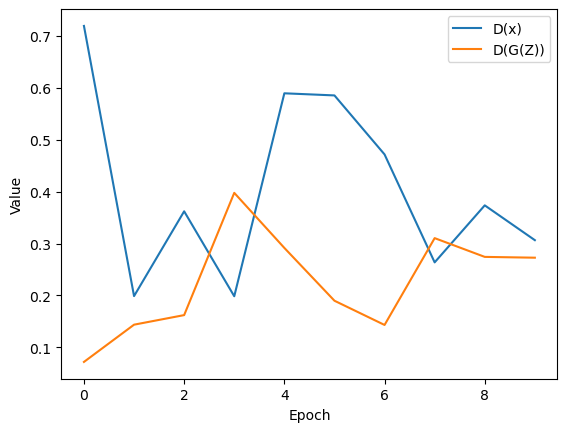

In [16]:
plt.plot(D_x_hist, label='D(x)')
plt.plot(D_Gz_hist, label='D(G(Z))')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.legend()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

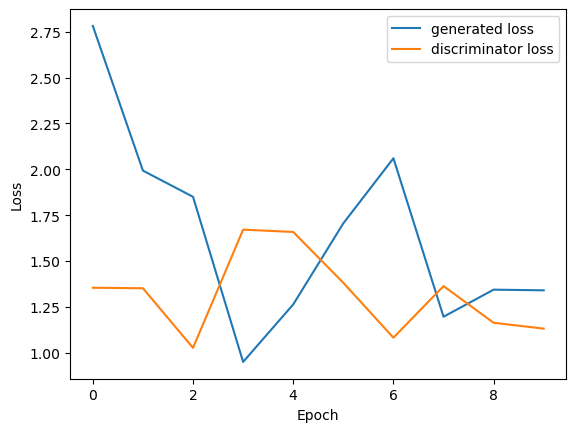

In [17]:
plt.plot(g_losses, label='generated loss')
plt.plot(d_losses, label='discriminator loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')

plt.legend()
plt.show

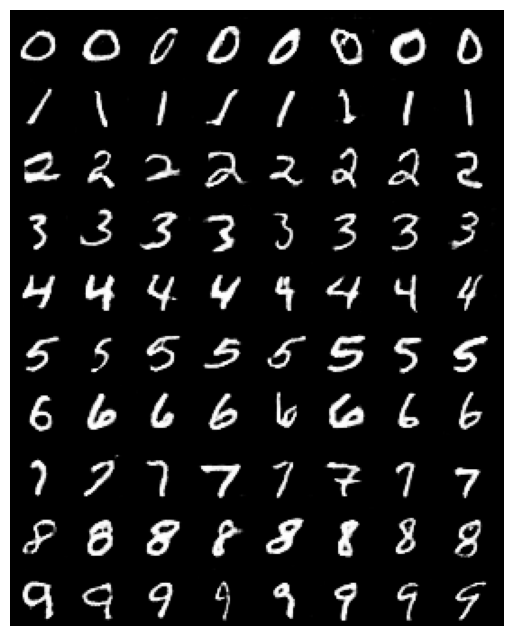

In [18]:
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

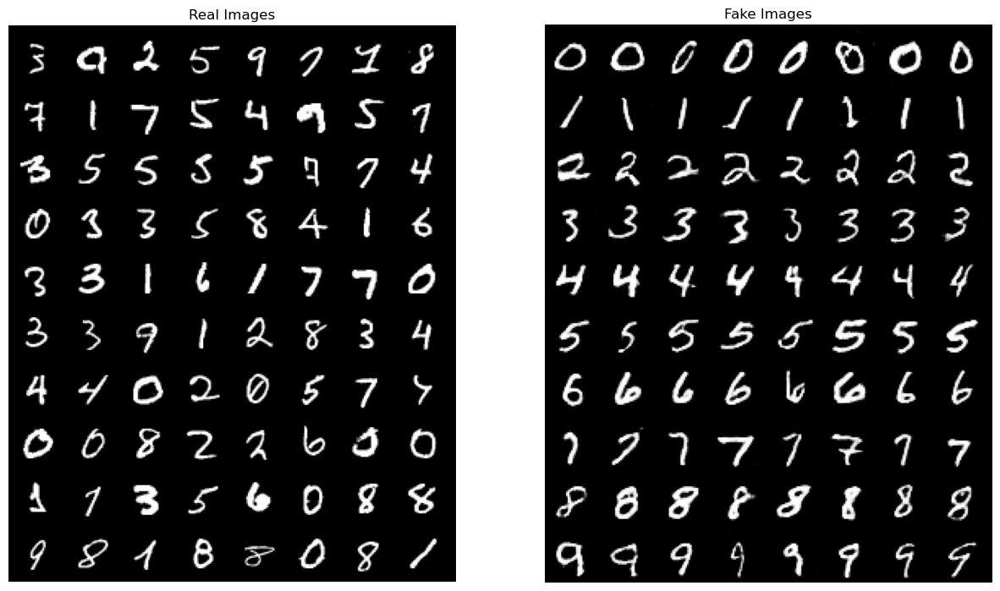

In [19]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(train_loader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].cuda()[:80], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)), cmap='binary')
plt.show()

In [20]:
# IS on test data
# py_x = []
# softmax = nn.Softmax(dim=1)
# for i, (images, _) in enumerate(test_loader):
#     images = images.cuda()
#     logit = net(images)
#     py_x += softmax(logit).cpu().tolist()
# IS = calculate_inception_score(np.array(py_x))
# IS

# Find Best Model

In [21]:
# # CGAN_Balance_LS
# checkpoint = torch.load('./save/CGAN_Balance_LS.pt')
# print("IS: {}, TARR: {}".format(checkpoint['IS'], checkpoint['TARR']))
# print("Accuracy on each class: ", checkpoint['class_acc'])

In [22]:
# # CGAN_Balance
# checkpoint = torch.load('./save/CGAN_Balance.pt')
# print("IS: {}, TARR: {}".format(checkpoint['IS'], checkpoint['TARR']))
# print("Accuracy on each class: ", checkpoint['class_acc'])

In [23]:
# # CGAN_VBN
# checkpoint = torch.load('./save/CGAN_VBN.pt')
# print("IS: {}, TARR: {}".format(checkpoint['IS'], checkpoint['TARR']))
# print("Accuracy on each class: ", checkpoint['class_acc'])

In [24]:
# # CGAN
# checkpoint = torch.load('./save/CGAN.pt')
# print("IS: {}, TARR: {}".format(checkpoint['IS'], checkpoint['TARR']))
# print("Accuracy on each class: ", checkpoint['class_acc'])

# Generate Images

In [25]:
# from torchvision.utils import save_image
# import torchvision.transforms as T
# from PIL import Image

# transform = T.ToPILImage()

# checkpoint = torch.load('./save/CGAN.pt')
# generator = Generator().cuda()
# generator.load_state_dict(checkpoint['generator_state_dict'])


# generator.eval()
# with torch.no_grad():
#     for i in range(10): # 10 class
#         for j in range(60): # generate 60 times, each time 100 img
#             z = torch.normal(0, 1, size=(100, 1, 100)).cuda()
#             labels = torch.tensor([i]*100).cuda()
#             fake_imgs = generator(z, labels)
            
#             # Save generated images
#             for k in range(100):
#                 img = transform(fake_imgs[k][0])
#                 img.save('./save/CGAN_Images/img_{}.png'.format(i*6000 + j*100 +k))
#                 print(i*6000 + j*100 +k)

In [26]:
# img = Image.open('./save/CGAN_Images/img_0.png')
# img = np.array(img)
# img.max()

In [27]:
# from torchvision.utils import save_image
# import torchvision.transforms as T
# from PIL import Image

# transform = T.ToPILImage()

# checkpoint = torch.load('./save/CGAN_Deep_D.pt')
# generator = Generator().cuda()
# generator.load_state_dict(checkpoint['generator_state_dict'])


# generator.eval()
# with torch.no_grad():
#     for i in range(10): # 10 class
#         for j in range(60): # generate 60 times, each time 100 img
#             z = torch.normal(0, 1, size=(100, 1, 100)).cuda()
#             labels = torch.tensor([i]*100).cuda()
#             fake_imgs = generator(z, labels)
            
#             # Save generated images
#             for k in range(100):
#                 img = transform(fake_imgs[k][0])
#                 img.save('./save/CGAN_Deep_Images/img_{}.png'.format(i*6000 + j*100 +k))
#                 print(i*6000 + j*100 +k)

In [28]:
# from torchvision.utils import save_image
# import torchvision.transforms as T
# from PIL import Image

# transform = T.ToPILImage()

# checkpoint = torch.load('./save/CGAN_Deep_D_LS.pt')
# generator = Generator().cuda()
# generator.load_state_dict(checkpoint['generator_state_dict'])


# generator.eval()
# with torch.no_grad():
#     for i in range(10): # 10 class
#         for j in range(60): # generate 60 times, each time 100 img
#             z = torch.normal(0, 1, size=(100, 1, 100)).cuda()
#             labels = torch.tensor([i]*100).cuda()
#             fake_imgs = generator(z, labels)
            
#             # Save generated images
#             for k in range(100):
#                 img = transform(fake_imgs[k][0])
#                 img.save('./save/CGAN_Deep_LS_Images/img_{}.png'.format(i*6000 + j*100 +k))
#                 print(i*6000 + j*100 +k)